## Phenology

The focus of this notebook is to analyse information for each pixel based on its focal neighborhood kernel. The [xrspatial.focal](https://xarray-spatial.org/user_guide/focal.html) module from `xarray-spatial` provides a set of analysis tools performing neighborhood operations and NDVI aggregration.

In [1]:
import planetary_computer as pc

import numpy as np
import xarray as xr

import stackstac
import pystac_client

import matplotlib.pyplot as plt

import geopandas as gpd
import json
import rasterio.features
from pystac.extensions.projection import ProjectionExtension as proj

import xrspatial.multispectral as ms
from xrspatial.convolution import calc_cellsize, circle_kernel, convolution_2d
from xrspatial.focal import mean, focal_stats, hotspots

from dask.distributed import Client, progress

### Local Dask Cluster

We'll use a small number of images for this example. We'll parallelize reading the data from Azure Blob Storage using a local Dask "cluster" on this single machine.

In [2]:
client = Client()
print(f"/proxy/{client.scheduler_info()['services']['dashboard']}/status")

/proxy/8787/status


You can access the Dask Dashboard by pasting that URL into the Dask labextension field. See [Scale with Dask](../quickstarts/scale-with-dask.ipynb) for more.

### Data

The region of interest is a small area in the Amazon rainforest located in State of Mato Grosso and State of Amazonas, Brazil. In order to calculate NDVI accurately, we found these least cloudy scenes by searching with the [STAC API](https://planetarycomputer.microsoft.com/docs/quickstarts/reading-stac/) and filtering the results.

In [3]:
#select country
country_name = "Niue" #change country name here eg; Fiji, Vanuatu, Tonga, Solomons, Kiribati, Niue, Cook Islands etc.
df = gpd.read_file('pic_bounding_box.geojson')
country = df.loc[df['NAME'] == country_name] 
aoi_json = json.loads(country.geometry.to_json())
area_of_interest = aoi_json['features'][0]['geometry']
#bbox = rasterio.features.bounds(area_of_interest)

catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1"
)

search = catalog.search(
    intersects=area_of_interest,
    datetime="2018-01-01/2021-12-01",
    collections=["sentinel-2-l2a"],
    limit=500,  # fetch items in batches of 500
    query={"eo:cloud_cover": {"lt": 25}},
)

In [4]:
items = [pc.sign(item).to_dict() for item in search.get_items()]
print(len(items))

160


Now we'll sign the STAC items so we can download the data from blob storage. See [Using Tokens for Data Access](../concepts/sas.ipynb) for more. 

In [5]:
item = next(search.get_items())
epsg = proj.ext(item).epsg

data = (
    stackstac.stack(
        items,
        epsg=epsg,
        resolution=500,
        assets=["B02", "B03", "B04", "B08"],  # blue, green, red, nir
        chunksize=256,  # set chunk size to 256 to get one chunk per time step
    )
    .where(lambda x: x > 0, other=np.nan)  # sentinel-2 uses 0 as nodata
    .assign_coords(
        band=lambda x: x.common_name.rename("band"),  # use common names
        time=lambda x: x.time.dt.round(
            "D"
        ),  # round time to daily for nicer plot labels
    )
)

#downsample to monthly
data = data.resample(time="MS").median("time", keep_attrs=True)

data

,Array,Chunk
Bytes,132.85 MiB,1.72 MiB
Shape,"(47, 4, 421, 220)","(4, 1, 256, 220)"
Count,9318 Tasks,328 Chunks
Type,float64,numpy.ndarray


In [6]:
#data = data.persist()
#progress(data)

### NDVI

NDVI can be calculated with [xarray-spatial](https://xarray-spatial.org/reference/_autosummary/xrspatial.multispectral.ndvi.html). We'll compute the NDVI for each year's image.

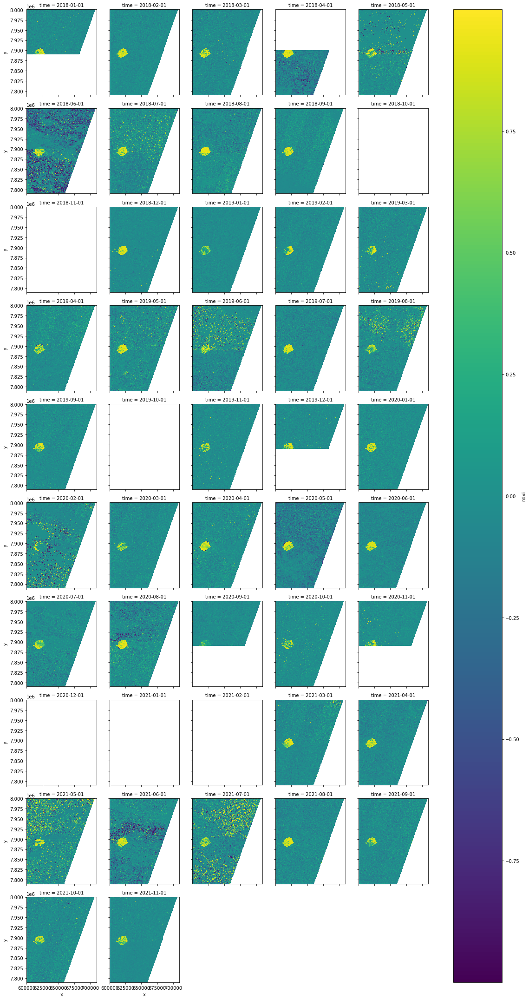

In [7]:
ndvi_aggs = [ms.ndvi(x.sel(band="nir"), x.sel(band="red")) for x in data]

ndvi = xr.concat(ndvi_aggs, dim="time")

ndvi.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis");

### Smoothing Images with Focal Mean

[`focal.mean`](https://xarray-spatial.org/reference/_autosummary/xrspatial.focal.mean.html) can be used to smooth or reduce noises in an image by a mean reduction to each 3x3 window in an image.

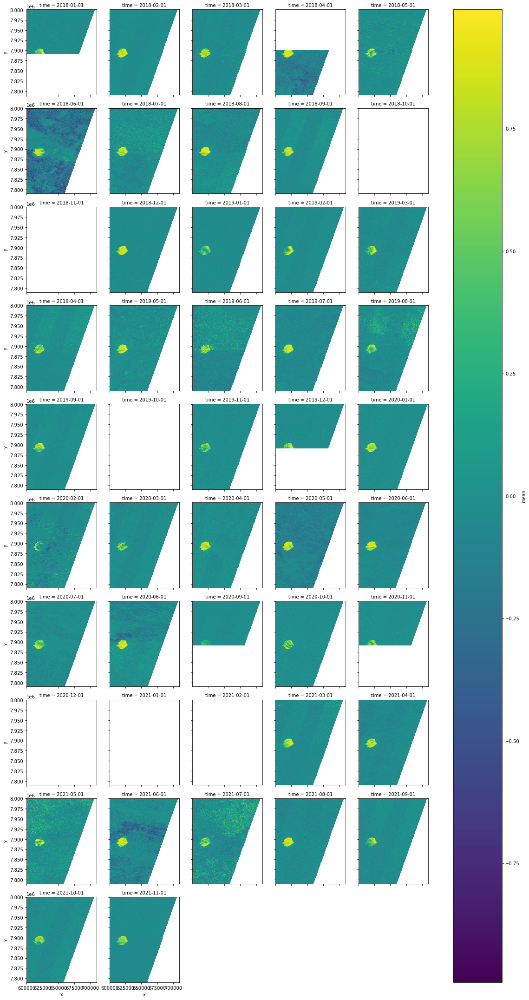

In [8]:
mean_aggs = [mean(ndvi_agg) for ndvi_agg in ndvi_aggs]

smooth = xr.concat(mean_aggs, dim="time")

s = smooth.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis")

In [9]:
cellsize = calc_cellsize(ndvi)
cellsize

(500.0, 500.0)

In [10]:
kernel = circle_kernel(*cellsize, radius=3 * cellsize[0])
kernel.shape

(7, 7)

In [11]:
%%time
stats_aggs = [focal_stats(ndvi_agg, kernel) for ndvi_agg in ndvi_aggs]

stats = xr.concat(stats_aggs, dim="time")

CPU times: user 4.03 s, sys: 150 ms, total: 4.18 s
Wall time: 4.01 s


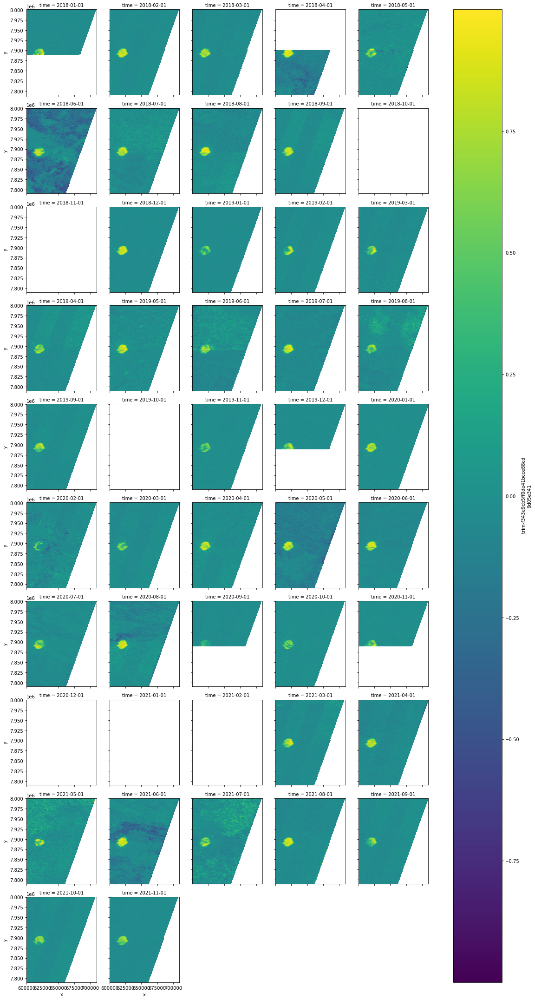

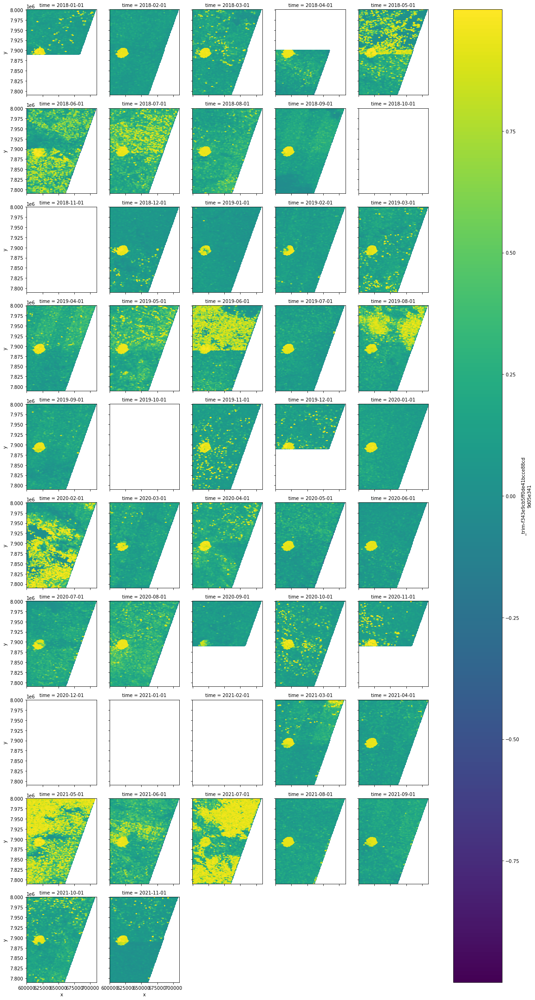

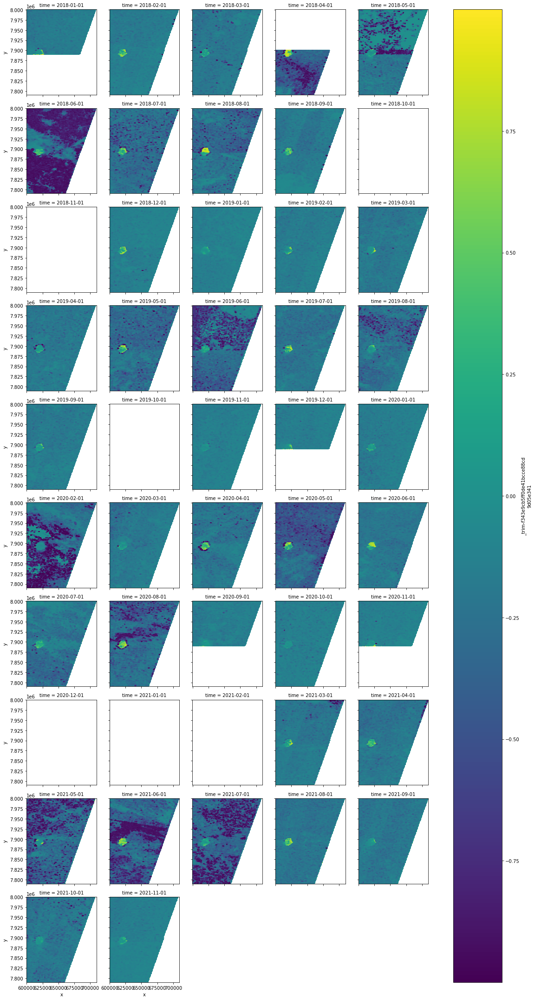

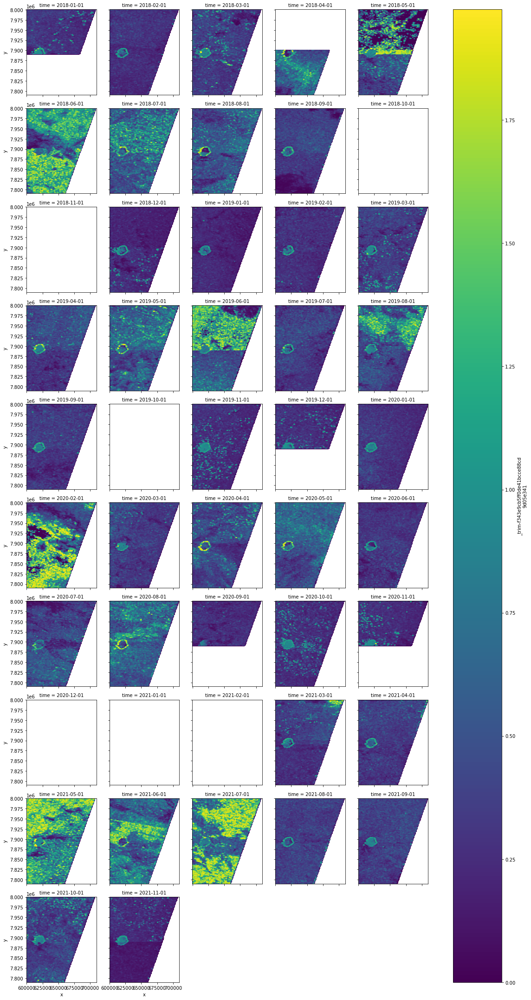

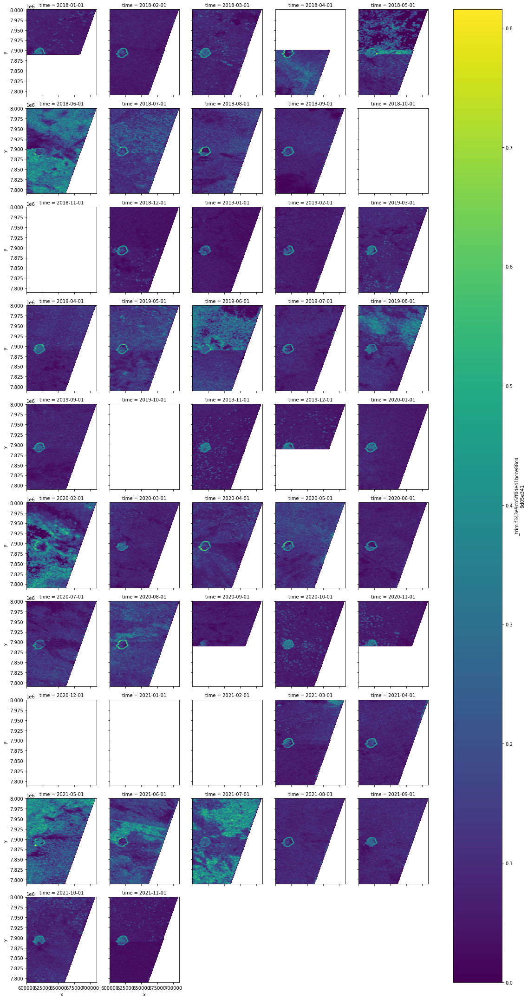

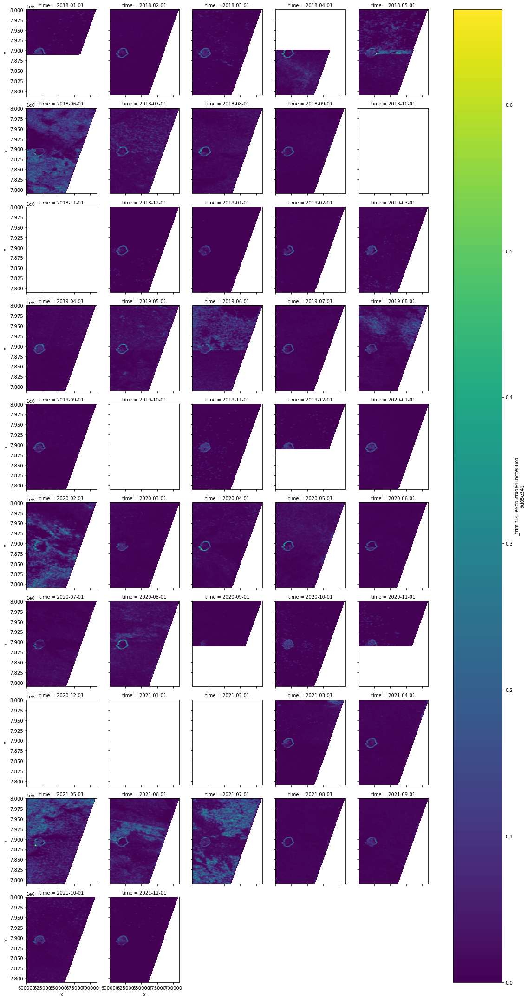

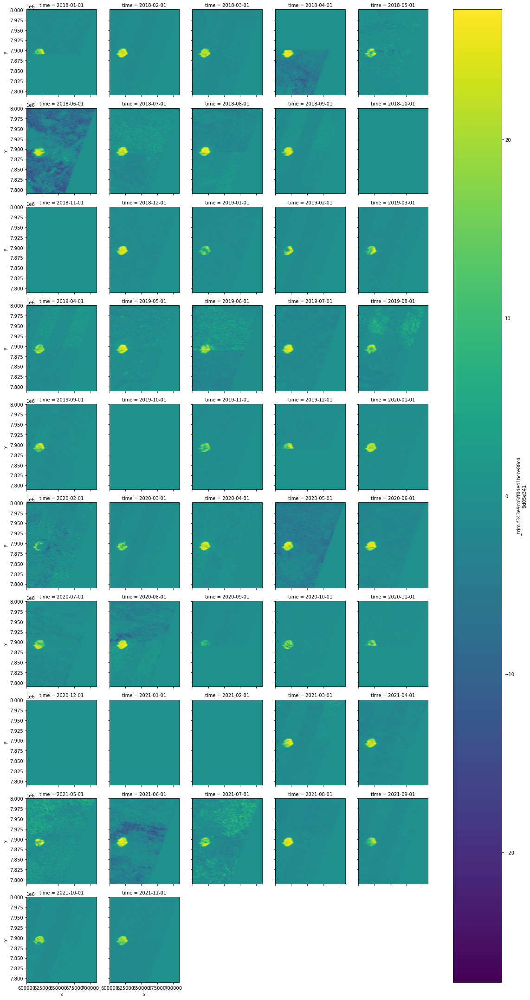

In [12]:
# transpose the data array so `stats` dimension appears first
stats_t = stats.transpose("stats", "time", "y", "x")

for stats_img in stats_t:
    g = stats_img.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis")

In [13]:
# Use Sobel operator
sobel_kernel = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])

sobel_kernel

array([[ 1,  0, -1],
       [ 2,  0, -2],
       [ 1,  0, -1]])

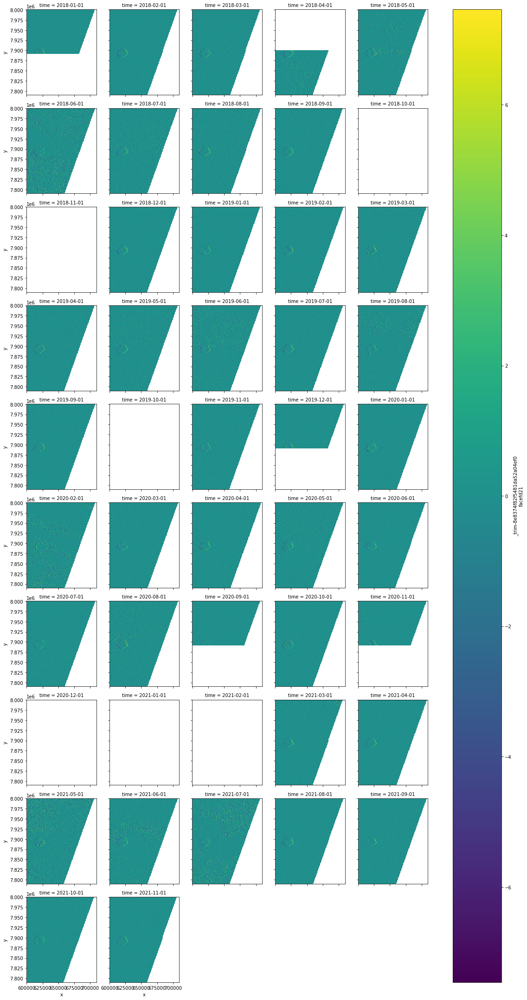

In [14]:
sobel_aggs = [convolution_2d(ndvi_agg, sobel_kernel) for ndvi_agg in ndvi_aggs]

sobel_agg = xr.concat(sobel_aggs, dim="time")

sobel_agg.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis");

### Write Out COG tiles and Upload as Azure Blobs
Pending...
